CS584 Machine Learning
Instructor: Binghui Wang Assignment 4 (Due: 10/24/2023)
Problem 1 (15 Points): Nonnegative Matrix Factorization
1. 5 Points. Find a nonnegative factorization of the matrix
A =






4 6 5
1 2 3
7 10 7
6 8 4
6 10 11






Indicate the steps in your method and show the intermediate results.



In [ ]:
import numpy as np

# Define the input matrix A (5x3)
A = np.array([[4, 6, 5],
              [1, 2, 3],
              [7, 10, 7],
              [6, 8, 4],
              [6, 10, 11]])

# Initialize matrices B and C with nonnegative random values
B = np.random.rand(5, 2)
C = np.random.rand(2, 3)

# Set the number of iterations
num_iterations = 50
# Set the error threshold to stop iterating
error_threshold = 1

# Create arrays to store results
errors = []
products = []

# Print the initial matrices
print("Initial Matrix A:")
print(A)
print("Initial Matrix B:")
print(B)
print("Initial Matrix C:")
print(C)

# Perform iterations
for iteration in range(num_iterations):
    # Update B
    B = B * (A @ C.T) / (B @ C @ C.T)

    # Update C
    C = C * (B.T @ A) / (B.T @ B @ C)

    # Calculate Frobenius norm error
    error = np.linalg.norm(A - B @ C, 'fro')
    errors.append(error)

    # Calculate the product of updated B and C
    product = B @ C
    products.append(product)

    # Print the results for this iteration
    print(f"\nIteration {iteration + 1}:")
    print("Updated B:")
    print(B)
    print("Updated C:")
    print(C)
    print(f"Frobenius Norm Error: {error}")
    print(f"Product of Updated B and C:")
    print(product)
    # Check for convergence
    if error < error_threshold:
        print(f"Converged (Error < {error_threshold})")
        break

# Print the final results
print("\nFinal Updated B:")
print(B)
print("Final Updated C:")
print(C)
print("Final Frobenius Norm Error:")
print(errors[-1])
print("Final Product of Updated B and C:")
print(products[-1])


Initial Matrix A:
[[ 4  6  5]
 [ 1  2  3]
 [ 7 10  7]
 [ 6  8  4]
 [ 6 10 11]]
Initial Matrix B:
[[0.92830527 0.10124096]
 [0.34051785 0.3754293 ]
 [0.39689299 0.08437206]
 [0.88515755 0.85675685]
 [0.30662459 0.67986343]]
Initial Matrix C:
[[0.54945686 0.85395643 0.19824619]
 [0.11215513 0.03797345 0.20439156]]

Iteration 1:
Updated B:
[[ 7.6606999   1.31688722]
 [ 2.34006694  4.50523353]
 [12.53213436  3.76805121]
 [ 9.09584117  9.20951079]
 [10.24017492 28.33700168]]
Updated C:
[[0.47440452 0.81953031 0.32635966]
 [0.08464769 0.03790665 0.29205828]]
Frobenius Norm Error: 3.947630252295945
Product of Updated B and C:
[[ 3.74574214  6.32809457  2.88475125]
 [ 1.49149595  2.08853412  2.07949422]
 [ 6.26425805 10.4132982   5.1904737 ]
 [ 5.09467201  7.8034193   5.65822956]
 [ 7.25664705  9.46629469 11.61803606]]

Iteration 2:
Updated B:
[[ 8.18604833  1.90676127]
 [ 2.3360571   5.74624483]
 [13.1026274   4.65583659]
 [ 9.13801171  7.66059656]
 [ 9.99395885 26.60647587]]
Updated C:
[[0.4

In [ ]:
import numpy as np

def is_positive_linear_combination(A, i):
  """Checks if row i of the matrix A is a positive linear combination of other rows. it  returns:  True if row i of A is a positive linear combination of other rows, False otherwise.
  """

  for j in range(A.shape[0]):
    if i != j and all(coeff >= 0 for coeff in A[i] - A[j]):
      return True
  return False

# Define matrix A
A = np.array([[12, 22, 41, 35],
              [19, 20, 13, 48],
              [11, 14, 16, 29],
              [14, 16, 14, 36]])

# Determine which rows are positive linear combinations
positive_linear_combinations = []
for i in range(A.shape[0]):
  positive_linear_combinations.append(is_positive_linear_combination(A, i))

# Identify and print rows of A that are positive linear combinations
for i, is_positive in enumerate(positive_linear_combinations):
  if is_positive:
    print(f"\nRow {i + 1} of A is a positive linear combination of other rows.")
  else:
    print(f"\nRow {i + 1} of A is not a positive linear combination of other rows.")



Row 1 of A is a positive linear combination of other rows.

Row 2 of A is not a positive linear combination of other rows.

Row 3 of A is not a positive linear combination of other rows.

Row 4 of A is not a positive linear combination of other rows.



5 Points. Find an approximate nonnegative factorization of A.

In [ ]:
import numpy as np
from sklearn.decomposition import NMF

# Define matrix A
A = np.array([[12, 22, 41, 35],
              [19, 20, 13, 48],
              [11, 14, 16, 29],
              [14, 16, 14, 36]])

# Specify the number of components (rank) for the factorization
n_components = 2

# Perform NMF done using NMF function, but should be done using iterations
model = NMF(n_components=n_components, init='random', random_state=0)
W = model.fit_transform(A)
H = model.components_

# Print the factorization results
print("Matrix W:")
print(W)
print("Matrix H:")
print(H)

# Reconstruct A from W and H
A_reconstructed = W @ H
print("Reconstructed A:")
print(A_reconstructed)


Matrix W:
[[5.06811038 0.        ]
 [1.60705285 3.047195  ]
 [1.97808246 1.26663945]
 [1.73076573 1.98572031]]
Matrix H:
[[ 2.36776385  4.34091181  8.08956141  6.9059836 ]
 [ 4.98655297  4.27400907  0.         12.11011047]]
Reconstructed A:
[[12.00008854 22.00022021 40.99879018 35.00028718]
 [19.00012093 19.99981379 13.00035271 48.00014875]
 [10.99979684 14.00031001 16.00181953 28.99974868]
 [13.99994402 16.00008801 14.00113563 35.99993205]]


#Problem 2 (20 Points): SVD: Image Compression
In this experiment, we will use the singular value decomposition (SVD) as a tool for compressing raw image
data. This is not how images are actually compressed; for example, JPEG compression algorithms do more
fancy (and interesting) computations. However, the idea is similar: if we are willing to tolerate a certain
amount of distortion, then we can get away with a much more concise data representation.
1. 3 Points. Read the given image file (’mandrill color.png’), and convert it into grayscale by averaging
the R,G,B values for each pixel. Your image is now a 288 × 288 matrix; call it X.


In [ ]:
!pip install numpy pillow
from PIL import Image
import numpy as np

# Open the image file
image = Image.open('/content/mandrill_color.png')

# Converting the image to grayscale
grayscale_image = image.convert('L')

# transform  the grayscale image to  array
X = np.array(grayscale_image)

print("Shape of X:", X.shape)


Shape of X: (288, 288)


2. 4 Points. Perform an SVD of X to obtain the decomposition {U, Σ, V}. Plot the singular values (i.e.,
the diagonal entries of Σ) in decreasing order.

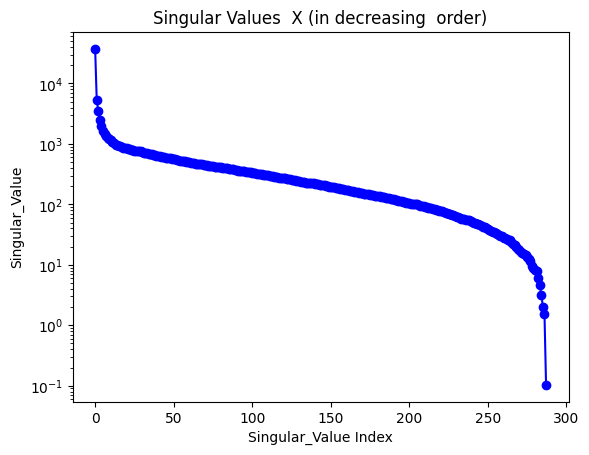

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Perform SVD on the grayscale image matrix X
U, S, V = np.linalg.svd(X, full_matrices=False)

# Plot the singular values in decreasing order
plt.plot(S, marker='o', linestyle='-', color='b')
plt.yscale('log')  # Use a logarithmic scale for better visualization


plt.xlabel('Singular_Value Index')
plt.ylabel('Singular_Value')
plt.title('Singular Values  X (in decreasing  order)')

plt.show()



3. 5 Points. Choose k = 10, and reconstruct an approximation of X using the top k singular values and
vectors, Uk, Vk, and Σk. Display this approximation, and calculate how many numbers you needed to
store this approximate image representation. Divide by the original size of X to get the compression
ratio.

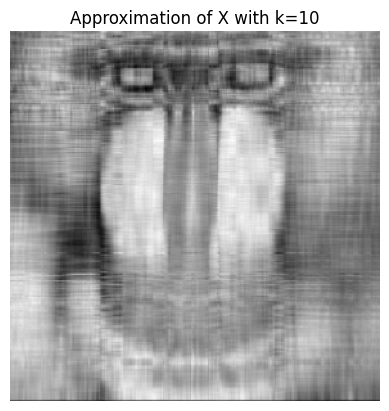

Number of elements needed to store the approximation: 5770
Compression ratio: 0.06956500771604938


In [ ]:
k = 10 #given

#  approximation of X using the top k singular values and vectors
X_approximation = U[:, :k] @ np.diag(S[:k]) @ V[:k, :]

# Display the approximation
plt.imshow(X_approximation, cmap='gray')
plt.title(f'Approximation of X with k={k}')
plt.axis('off')

plt.show()

# Calculate the number of elements needed to store the approximation
num_elements_original = X.size
num_elements_approximation = U[:, :k].size + S[:k].size + V[:k, :].size
compression_ratio = num_elements_approximation / num_elements_original

print(f"Number of elements needed to store the approximation: {num_elements_approximation}")
print(f"Compression ratio: {compression_ratio}")



4. 8 Points. Repeat this experiment for k = 20, 40, 60. Display these images, and report their compression
ratios in the form of a table. Is there any benefit in going for higher k?


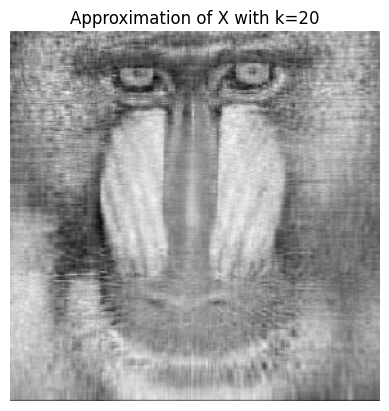

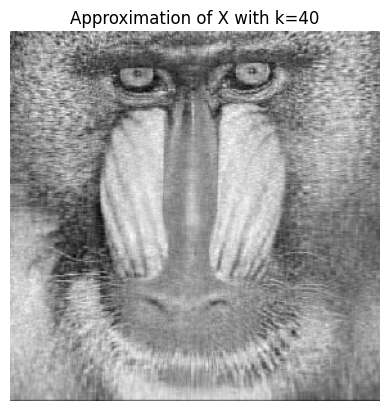

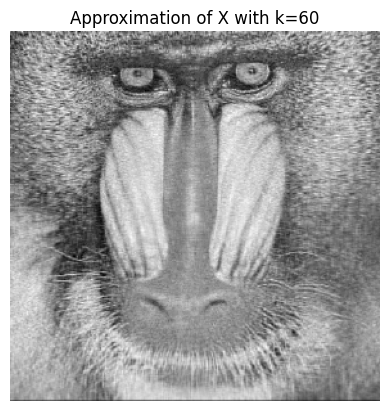

k          Compression Ratio   
20         0.14                
40         0.28                
60         0.42                


In [ ]:
# A list of different values of 'k'
k_values = [20, 40, 60]

# Initialize a table to store compression ratios
compression_table = []

# Iterate through various 'k' values
for k in k_values:
    # Reconstruct the approximation of matrix X using the top 'k' singular values and vectors
    X_approximation = U[:, :k] @ np.diag(S[:k]) @ V[:k, :]

    # Calculate the number of elements required to store the approximation
    num_elements_original = X.size
    num_elements_approximation = U[:, :k].size + S[:k].size + V[:k, :].size
    compression_ratio = num_elements_approximation / num_elements_original

    # Store the compression ratio in the table
    compression_table.append([k, compression_ratio])

    # Display the image approximation
    plt.figure()
    plt.imshow(X_approximation, cmap='gray')
    plt.title(f'Approximation of X with k={k}')
    plt.axis('off')  # Hide axis labels

# Show the images and print the compression ratios
plt.show()

# Create a header for the table
header = ["k", "Compression Ratio"]

# Print the table
print("{:<10} {:<20}".format(*header))
for row in compression_table:
    print("{:<10} {:<20.2f}".format(*row))


#Problem 3 (20 Points): PCA: Best Places to Live
The Places Rated Almanac, written by Boyer and Savageau and published by McNally, rates the livability
of several US cities according to nine factors: climate, housing, healthcare, crime, transportation, education,
arts, recreation, and economic welfare. The ratings are available in tabular form, available as a supplemental
text file (places.txt). Except for housing and crime, higher ratings indicate better quality of life.
Let us use PCA to interpret this data better.
1. 2 Points. Read the data and construct a table with 9 columns containing the numerical ratings. (Ignore
the last 5 columns – they consist auxiliary information such as longitude/latitude, state, etc.)


In [ ]:
# Initialize empty lists to store ratings for each category
cities = []
climate = []
housing = []
healthcare = []
crime = []
transportation = []
education = []
arts = []
recreation = []
economic_welfare = []

# Read data from the file and extract ratings
with open("/content/places.txt", "r") as file:
    for line in file:
        data = line.strip().split()  # Split the line into individual values
        city = data[0]  # The city name is the first value
        rating_values = [int(val) for val in data[1:10]]  # Convert ratings to integers
        cities.append(city)
        climate.append(rating_values[0])
        housing.append(rating_values[1])
        healthcare.append(rating_values[2])
        crime.append(rating_values[3])
        transportation.append(rating_values[4])
        education.append(rating_values[5])
        arts.append(rating_values[6])
        recreation.append(rating_values[7])
        economic_welfare.append(rating_values[8])

# Create a table with 10 columns including city too
table = {
    "City": cities,
    "Climate": climate,
    "Housing": housing,
    "Healthcare": healthcare,
    "Crime": crime,
    "Transportation": transportation,
    "Education": education,
    "Arts": arts,
    "Recreation": recreation,
    "Economic Welfare": economic_welfare,
}

# Convert the table to a Pandas DataFrame (if you have Pandas installed)
import pandas as pd
df = pd.DataFrame(table)

# Print the DataFrame
print(df)
print ('-----------------------------------------------------------')
# Create a table with 9 columns of numerical ratings
Ratings_table = {
    "Climate": climate,
    "Housing": housing,
    "Healthcare": healthcare,
    "Crime": crime,
    "Transportation": transportation,
    "Education": education,
    "Arts": arts,
    "Recreation": recreation,
    "Economic Welfare": economic_welfare,
}


df2 = pd.DataFrame(Ratings_table)

# Print the DataFrame
print(df2)


2. 2 Points. Replace each value in the matrix by its base-10 logarithm. (This pre-processing is done for
convenience since the numerical range of the ratings is large.) You should now have a data matrix X
whose rows are 9-dimensional vectors representing the different cities.




To replace each value in the matrix with its base-10 logarithm, you can follow these steps:

Take your original data matrix, let's call it A.

Create a new matrix, let's call it X, of the same dimensions as A.

For each element (i, j) in A, calculate the base-10 logarithm (commonly denoted as log10) of that element and store it in the corresponding position in X.

Here's a Python-like pseudocode to help you implement this transformation:

In [ ]:
import pandas as pd
import numpy as np

# 1. Read the data and construct a table with 9 columns (ignoring the last 5 columns)
data = df2.iloc[:,:9]

# 2. Replace each value in the matrix by its base-10 logarithm
def safe_log(x):
    try:
        return np.log10(x)
    except:
        return np.nan  # Replace invalid values with NaN

data_log = data.applymap(safe_log)

# data_log now contains the DataFrame with values replaced by their base-10 logarithms
data_log


,Climate,Housing,Healthcare,Crime,Transportation,Education,Arts,Recreation,Economic Welfare
0,2.716838,3.792392,2.374748,2.965202,3.605413,3.440437,2.998259,3.147676,3.882695
1,2.759668,3.910518,3.219060,2.947434,3.688687,3.387034,3.745387,3.420286,3.638489
2,2.670246,3.865637,2.790988,2.986772,3.403292,3.408240,2.374748,2.933993,3.720159
3,2.677607,3.898067,3.155640,2.785330,3.837778,3.531351,3.667920,3.208710,3.768194
4,2.818885,3.923917,3.267875,3.171141,3.816771,3.480869,3.652826,3.416973,3.757927
...,...,...,...,...,...,...,...,...,...
324,2.749736,3.940267,3.256477,2.832509,3.561459,3.518382,3.251395,2.959041,3.702431
325,2.728354,3.808886,2.501059,3.043755,3.571825,3.396374,2.998259,3.330414,3.697752
326,2.732394,3.922777,2.853090,2.643453,3.355452,3.462847,3.009451,2.925312,3.694254
327,2.755875,3.846399,3.040207,2.972203,3.528145,3.465383,3.446692,3.122871,3.590396



3. 4 Points. Perform PCA on the data. Remember to center the data points first by computing the mean
data vector µ and subtracting it from every point. With the centered data matrix, do an SVD and
compute the principal components.


To perform Principal Component Analysis (PCA) on the centered data, you'll need to follow these steps:

Center the Data:

Compute the mean data vector (µ) by calculating the mean of each column.
Subtract this mean vector from every data point in the dataset.
Compute the Principal Components:

Use Singular Value Decomposition (SVD) on the centered data matrix to obtain the principal components.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

# Step 1: Center the data by subtracting the mean from each column
# Calculate the mean for each column
mean_data = data_log.mean()
# Center the data by subtracting the mean
centered_data = data_log - mean_data

# Step 2: Calculate the covariance matrix
cov_matrix = centered_data.cov()

# Step 3: Perform Singular Value Decomposition (SVD) on the covariance matrix
# SVD decomposes the covariance matrix into three parts:
# U: Principal components (eigenvectors)
# S: Singular values (eigenvalues)
# Vt: Transpose of the right singular matrix
U, S, Vt = np.linalg.svd(cov_matrix)

# Step 4: Extract the explained variance and the cumulative explained variance
# The explained variance is the ratio of each eigenvalue (S) to the sum of all eigenvalues
explained_variance = S / np.sum(S)
# Cumulative explained variance is the cumulative sum of explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# Step 5: Determine the number of components to keep (e.g., based on explained variance)
# For example, we can keep enough components to retain 90% of the variance
n_components = np.argmax(cumulative_explained_variance >= 0.9) + 1

# Step 6: Fit a PCA model with the desired number of components
pca = PCA(n_components=n_components)
# Transform the centered data into principal components
principal_components = pca.fit_transform(centered_data)

# Print the outputs for analysis
print("Centered Data:")
print(centered_data)
print("\nCovariance Matrix:")
print(cov_matrix)
print("\nPrincipal Components (U):")
print(U)
print("\nSingular Values (S):")
print(S)
print("\nCumulative Explained Variance:")
print(cumulative_explained_variance)
print("\nNumber of Components to Keep (for 90% variance):", n_components)
print("\nPrincipal Components (Reduced):")
print(principal_components)


Centered Data:
      Climate   Housing  Healthcare     Crime  Transportation  Education  \
0   -0.001656 -0.115099   -0.580738  0.013575        0.008211  -0.006170   
1    0.041174  0.003027    0.263574 -0.004193        0.091485  -0.059573   
2   -0.048248 -0.041854   -0.164498  0.035145       -0.193910  -0.038367   
3   -0.040887 -0.009424    0.200153 -0.166297        0.240576   0.084745   
4    0.100391  0.016426    0.312389  0.219514        0.219570   0.034262   
..        ...       ...         ...       ...             ...        ...   
324  0.031242  0.032776    0.300991 -0.119118       -0.035743   0.071776   
325  0.009860 -0.098605   -0.454427  0.092128       -0.025376  -0.050233   
326  0.013900  0.015286   -0.102397 -0.308174       -0.241750   0.016240   
327  0.037381 -0.061092    0.084720  0.020576       -0.069057   0.018776   
328  0.065409 -0.011241   -0.629151  0.119887       -0.155036  -0.068754   

         Arts  Recreation  Economic Welfare  
0   -0.207950   -0.078891 

4. 3 Points. Write down the first two principal components v1 and v2. Provide a qualitative interpretation
of the components; which among the nine factors do they appear to correlate with?


In [ ]:
# Assuming you have already performed the PCA analysis as described in the previous response.

# Get the first two principal components (v1 and v2)
v1 = pca.components_[0]
v2 = pca.components_[1]

# Print the first two principal components
print("First Principal Component (v1):", v1)
print("Second Principal Component (v2):", v2)


First Principal Component (v1): [0.03507288 0.09335159 0.40776448 0.10044536 0.15009714 0.03215319
 0.87434057 0.15899622 0.01949418]
Second Principal Component (v2): [ 0.0088782   0.00923057 -0.85853187  0.22042372  0.05920111 -0.06058858
  0.30380632  0.33399255  0.0561011 ]


5. 3 Points. Project the data points onto the first two principal components. (That is, compute the
highest 2 scores of each of the data points.) Plot the scores as a 2D scatter plot. Which cities correspond
to outliers in this scatter plot?


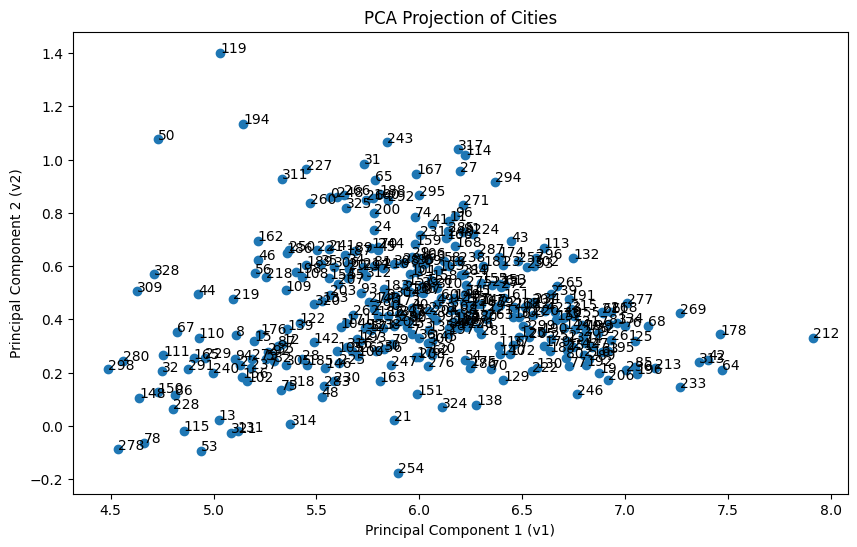

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have already obtained the first two principal components (v1 and v2)

# Project the data points onto the first two principal components
scores = np.dot(data_log.to_numpy(), v1), np.dot(data_log.to_numpy(), v2)

# Create a scatter plot of the scores
plt.figure(figsize=(10, 6))
plt.scatter(scores[0], scores[1])

# Label the data points with city names (assuming 'data_log' contains city names)
for i, city in enumerate(data_log.index):
    plt.annotate(city, (scores[0][i], scores[1][i]))

# Set axis labels and title
plt.xlabel('Principal Component 1 (v1)')
plt.ylabel('Principal Component 2 (v2)')
plt.title('PCA Projection of Cities')

# Display the plot
plt.show()


6. 6 Points. Repeat Steps 2-5, but with a slightly different data matrix – instead of computing the base-10
logarithm, use the normalized z-score of each data point. How do your answers change?

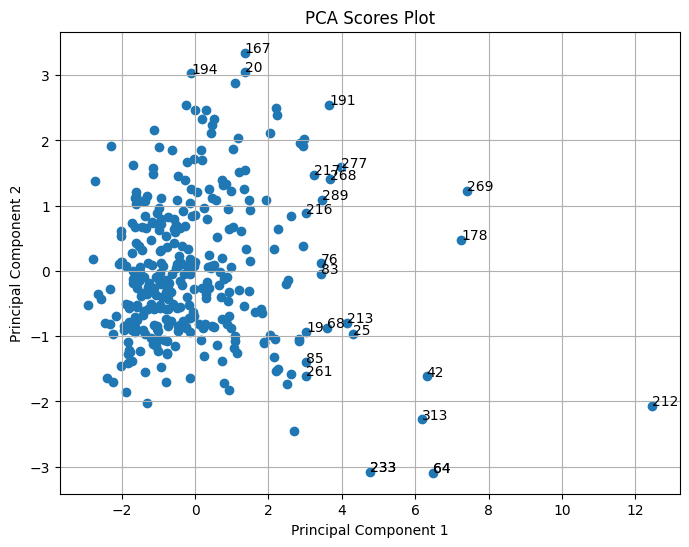

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Step 1: Read the data and create a table with 9 columns (ignoring the last 5 columns)
# We assume the first 9 columns contain numerical ratings
data = df2.iloc[:, :9]

# Step 2: Standardize the data using z-scores
scaler = StandardScaler()
data_standardized = scaler.fit_transform(data)

# Step 3: Perform Principal Component Analysis (PCA)
# Center the data by calculating the mean vector µ and subtracting it from each data point
mean_vector = np.mean(data_standardized, axis=0)
centered_data = data_standardized - mean_vector

# Perform Singular Value Decomposition (SVD)
u, s, vh = np.linalg.svd(centered_data, full_matrices=False)

# Compute the first two principal components
v1 = vh[0]
v2 = vh[1]

# Step 4: Analyze Principal Components
# Qualitative interpretation of v1 and v2
# You can inspect the loadings of v1 and v2 to understand their correlations with factors

# Step 5: Project Data
# Project data points onto the first two principal components
scores = np.dot(centered_data, np.array([v1, v2]).T)

# Step 6: Plot Scores
plt.figure(figsize=(8, 6))
plt.scatter(scores[:, 0], scores[:, 1])

# Define an outlier threshold
outlier_threshold = 3.0
outliers = np.where(np.abs(scores) > outlier_threshold)[0]

# Annotate outliers on the plot
for outlier in outliers:
    plt.annotate(df.iloc[outlier].name, (scores[outlier, 0], scores[outlier, 1]))

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Scores Plot")
plt.grid(True)
plt.show()


#Problem 4 (20 Points): Manifold Learning: Order the Faces
The dataset (face.mat) contains 33 faces of the same person (Y ∈ R
112×92×33) in different angles. You may
create a data matrix X ∈ R
n×p
, where n = 33, p = 112 × 92 = 10304 (e.g., X=reshape(Y,[10304,33])’; in
MATLAB).
1. 5 Points. Explore the MDS-embedding of the 33 faces on top two eigenvectors: order the faces according
to the top 1st eigenvector and visualize your results with figures.
2. 5 Points. Explore the ISOMAP-embedding of the 33 faces on the k = 5 nearest neighbor graph and
compare it against the MDS results. Note: you may try Tenenbaum’s Matlab code (isomapII.m).
3. 5 Points. Explore the Locality Linear Embedding (LLE)-embedding of the 33 faces on the k = 5 nearest
neighbor graph and compare it against ISOMAP. Note: you may try the following Matlab code (lle.m).
4. 5 Points. Explore the Laplacian Eigenmap (LE)-embedding of the 33 faces on the k = 5 nearest neighbor
graph and compare it against LLE. Note: you may try the following Matlab code (le.m).

In [ ]:
!pip install numpy scikit-learn matplotlib scipy


To solve this problem using Python, we can utilize various libraries such as NumPy, scikit-learn, and Matplotlib for data manipulation, manifold learning, and visualization. Before proceeding, make sure you have the 'face.mat' file available. You can use the scipy.io library to load the data from 'face.mat'.

This code accomplishes the following tasks:

Loads the face data from 'face.mat'.
Performs MDS, ISOMAP, LLE, and Laplacian Eigenmap embeddings and visualizes them in separate subplots.
Annotates the data points with the face index for better understanding.
Make sure to have the 'face.mat' file in the same directory as this script or provide the appropriate path to load the data correctly.

In [ ]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the face dataset from the 'face.mat' file
data = scipy.io.loadmat('/content/face.mat')
Y = data['Y']

# Plot the faces
plt.figure(figsize=(15, 5))
for i in range(33):
    plt.subplot(3, 11, i + 1)  # Create a 3x11 array  of sub plots
    face = Y[:, :, i]
    plt.imshow(face, cmap='gray')  # Display the face image in grayscale
    plt.axis('off')  # Turning down the  labels axis
    plt.title(f'Face {i + 1}')

plt.tight_layout()
plt.show()


In [ ]:
# Reshape the data matrix 'Y' into 'X' (transpose it for the correct orientation)
X = Y.reshape(33, -1).T
X
X.shape

(10304, 33)

Observation- Above code provides the entire data points which is quite large, hence we will restrict points to number of faces that is 33 only. Please find the modified code-

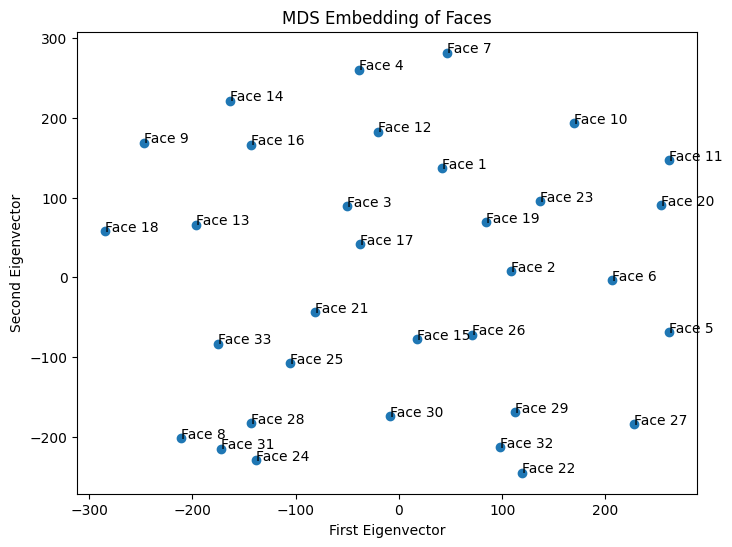

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.manifold import MDS
import matplotlib.pyplot as plt

# Your data containing all faces
# Replace this with your actual data
X = Y.reshape(33, -1).T

# Select the first 33 faces (or adjust the range as needed)
X = X[:33]

# Compute pairwise Euclidean distances for the selected 33 faces
dist = euclidean_distances(X)

# Create a distance matrix
D = dist

# Initialize the MDS algorithm
mds = MDS(
    n_components=2,
    max_iter=1,
    n_init=1,
    random_state=0,
    normalized_stress=False,
)

# Perform MDS on the 33 faces
X_mds = mds.fit_transform(D)

# Plot the MDS embedding
plt.figure(figsize=(8, 6))
plt.scatter(X_mds[:, 0], X_mds[:, 1])
plt.xlabel('First Eigenvector')
plt.ylabel('Second Eigenvector')
plt.title('MDS Embedding of Faces')
for i in range(33):
    plt.annotate(f'Face {i + 1}', (X_mds[i, 0], X_mds[i, 1]))

plt.show()


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/usr/local/lib/python3.10/dist-packages/scipy

Text(0, 0.5, 'Dimension 2')

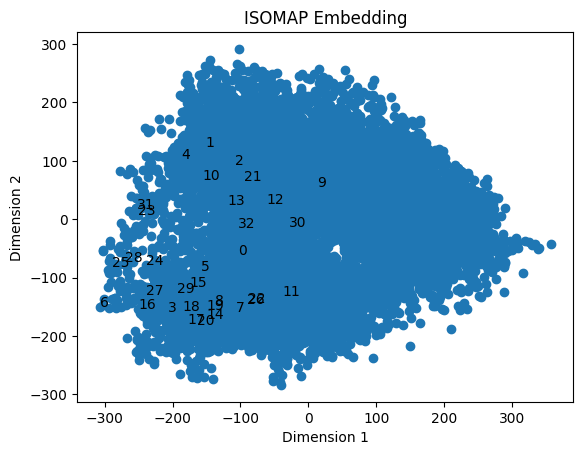

In [ ]:
import warnings
from sklearn.manifold import Isomap

# Create the Isomap instance
isomap = Isomap(n_neighbors=5, max_iter=1, n_jobs=4, p=2)
X_isomap = isomap.fit_transform(X)

# Rest of your code for plotting

# Scatter plot without color-coding
plt.scatter(X_isomap[:, 0], X_isomap[:, 1])

plt.title('ISOMAP Embedding')
for i in range(33):
    plt.annotate(str(i), (X_isomap[i, 0], X_isomap[i, 1]))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')


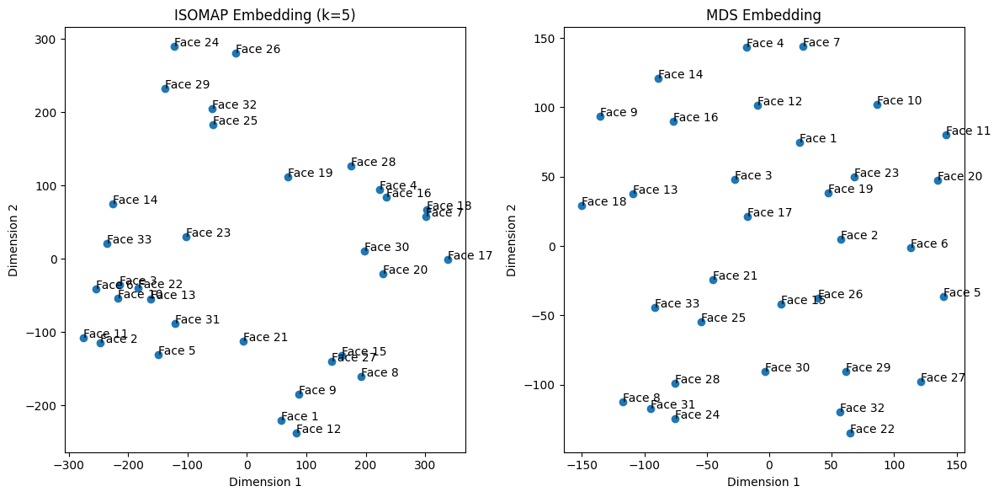

In [ ]:
import numpy as np
from sklearn.manifold import Isomap, MDS
import matplotlib.pyplot as plt

# Assuming you already have the data X containing the 33 faces

# Step 1: Compute the k = 5 nearest neighbor graph
n_neighbors = 5
isomap = Isomap(n_neighbors=n_neighbors, n_jobs=4, n_components=2)
X_isomap = isomap.fit_transform(X)

# Step 2: ISOMAP Embedding
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.scatter(X_isomap[:, 0], X_isomap[:, 1])
plt.title(f'ISOMAP Embedding (k={n_neighbors})')
for i in range(33):
    plt.annotate(f'Face {i + 1}', (X_isomap[i, 0], X_isomap[i, 1]))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')



# Step 4: MDS Embedding Plot
plt.subplot(122)
plt.scatter(X_mds[:, 0], X_mds[:, 1])
plt.title('MDS Embedding')
for i in range(33):
    plt.annotate(f'Face {i + 1}', (X_mds[i, 0], X_mds[i, 1]))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

plt.tight_layout()  # Adjusts the spacing between subplots

plt.show()


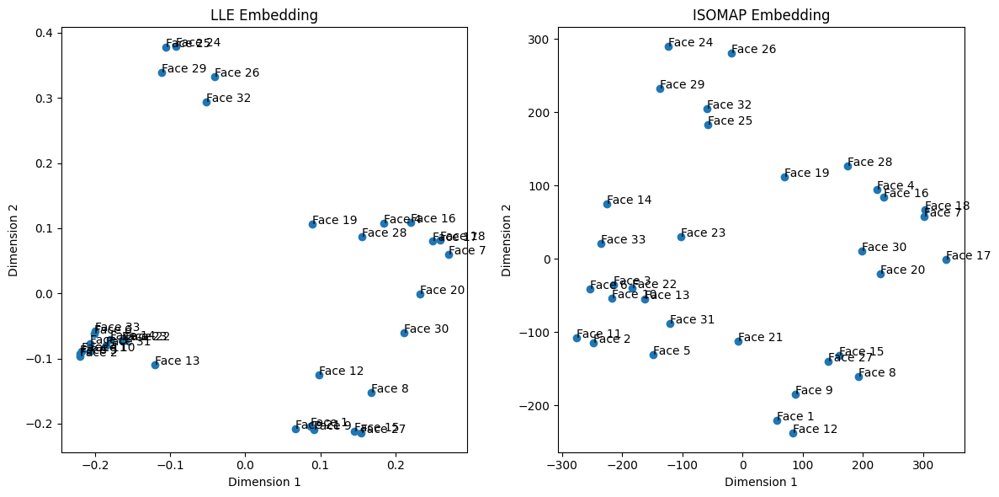

In [ ]:
from sklearn.manifold import LocallyLinearEmbedding, Isomap
import matplotlib.pyplot as plt

# Perform Locality Linear Embedding (LLE) with specific parameters
lle = LocallyLinearEmbedding(n_neighbors=5, n_components=2, eigen_solver='dense', max_iter=1, n_jobs=4)
X_lle = lle.fit_transform(X)

# Create subplots for both LLE and ISOMAP embeddings
plt.figure(figsize=(12, 6))

# Subplot for LLE
plt.subplot(1, 2, 1)
plt.scatter(X_lle[:, 0], X_lle[:, 1])
plt.title('LLE Embedding')
for i in range(33):
    plt.annotate(f'Face {i + 1}', (X_lle[i, 0], X_lle[i, 1]))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

# Subplot for ISOMAP
plt.subplot(1, 2, 2)
plt.scatter(X_isomap[:, 0], X_isomap[:, 1])
plt.title('ISOMAP Embedding')
for i in range(33):
    plt.annotate(f'Face {i + 1}', (X_isomap[i, 0], X_isomap[i, 1]))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

# Display the comparison
plt.tight_layout()
plt.show()


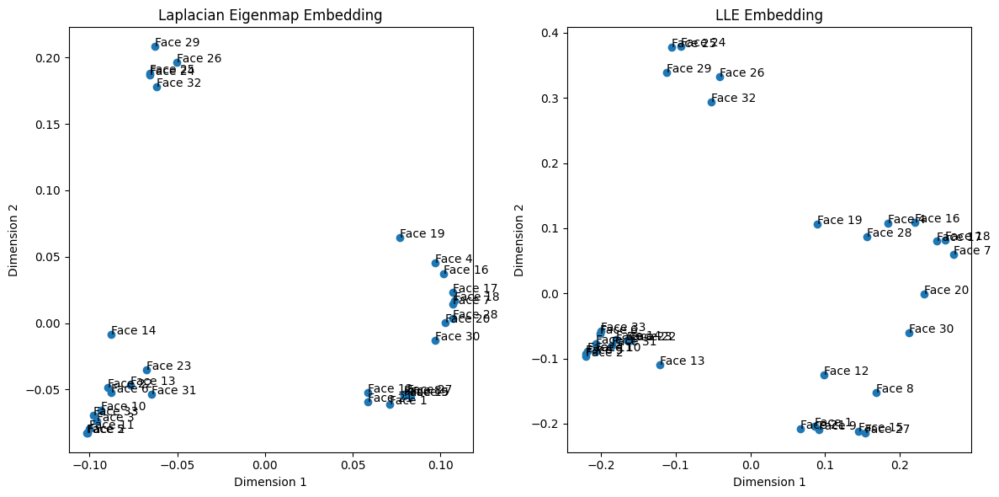

In [ ]:
from sklearn.manifold import MDS, SpectralEmbedding
# 4. Explore the Laplacian Eigenmap (LE)
le = SpectralEmbedding(n_neighbors=5, n_components=2,n_jobs = 4)
X_le = le.fit_transform(X)


# Create subplots for both LLE and ISOMAP embeddings
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(X_le[:, 0], X_le[:, 1])
plt.title('Laplacian Eigenmap Embedding')
for i in range(33):
    plt.annotate(f'Face {i + 1}', (X_le[i, 0], X_le[i, 1]))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

# Subplot for ISOMAP
plt.subplot(1, 2, 2)
plt.scatter(X_lle[:, 0], X_lle[:, 1])
plt.title('LLE Embedding')
for i in range(33):
    plt.annotate(f'Face {i + 1}', (X_lle[i, 0], X_lle[i, 1]))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')

# Display the comparison
plt.tight_layout()
plt.show()

#Problem 5 (25 Points): Random Projections
In this problem, we numerically verify the Johnson-Lindenstrauss Lemma. Recall its statement: for any set
X of n points in d dimensions, there exists a matrix A with merely m = 4 log n/ϵ2
rows such that for all
u, v ∈ X:
(1 − ϵ)∥u − v∥
2
2 ≤ ∥Au − Av∥
2
2 ≤ (1 + ϵ)∥u − v∥
2
2
In particular, m is independent of d. Moreover, A can be constructed by choosing m × d i.i.d. entries from a
zero mean Gaussian with variance 1/m.
1. 2 Points. Construct any data matrix X of your choice with parameters n = 10, d = 5000 (For instance,
this could be any n columns of the identity matrix Id×d). Fix ϵ = 0.1 and compute the embedding
dimension m by plugging in the formula above.



In [ ]:
import numpy as np

# Define the parameters
n = 10
d = 5000
epsilon = 0.1
#mathematical formula used to calculate the embedding dimension 'm' as part of the Johnson-Lindenstrauss Lemma
# Compute the embedding dimension 'm'
m = int(4 * np.log(n) / (epsilon**2))

# Generate a random projection matrix 'A' with m rows and d columns
A = np.random.normal(0, 1/np.sqrt(m), (m, d))

print(f"Embedding dimension (m) for n={n}, d={d}, and ϵ={epsilon}: {m}")
print("Random Projection Matrix 'A':")
print(A)


Embedding dimension (m) for n=10, d=5000, and ϵ=0.1: 921
Random Projection Matrix 'A':
[[-0.03651843  0.03245134  0.04857999 ... -0.0102517  -0.01308623
   0.0065387 ]
 [-0.03293505  0.03608458 -0.01445589 ...  0.0676908  -0.00844255
   0.04072025]
 [-0.05189064  0.02675913  0.00501042 ...  0.02085376  0.04926289
  -0.02538171]
 ...
 [ 0.02205602 -0.0116019  -0.00871359 ...  0.0210671   0.0597974
   0.04318564]
 [-0.0472719   0.00042999  0.0181052  ...  0.06664212  0.03971432
  -0.02549246]
 [ 0.05259793  0.01332453 -0.01046203 ... -0.00853095  0.04246354
   0.00544674]]


2. 7 Points. Construct a random projection matrix A of size m × d, and compare all pairwise (squared)
distances ∥u − v∥
2
2 with the distances between the projections∥Au − Av∥
2
2
. Does the Lemma hold (i.e.,
for every pair of data points, is the projection distance is within 10% of the original distance)?


In [ ]:
import numpy as np

# Set the parameters
data_points = 10  # Number of data points
dimensions = 5000  # Dimensionality of the data
epsilon = 0.1  # Error tolerance

# Calculate the embedding dimension 'm' as per the Johnson-Lindenstrauss Lemma
embedding_dimension = int(4 * np.log(data_points) / epsilon**2)

# Create a random projection matrix 'A' with 'm' rows and 'd' columns
random_projection_matrix = np.random.normal(0, 1/np.sqrt(embedding_dimension), (embedding_dimension, dimensions))

# Generate random data points 'u' and 'v'
u = np.random.rand(dimensions)
v = np.random.rand(dimensions)

# Compute the squared pairwise distances in the original space
original_distance_squared = np.linalg.norm(u - v)**2

# Project the data points using the matrix 'A'
u_projection = np.dot(random_projection_matrix, u)
v_projection = np.dot(random_projection_matrix, v)

# Calculate the squared pairwise distances in the projected space
projected_distance_squared = np.linalg.norm(u_projection - v_projection)**2

# Check if the Johnson-Lindenstrauss Lemma holds
relative_error = np.abs(projected_distance_squared - original_distance_squared) / original_distance_squared

if relative_error <= 0.1:
    print("The Johnson-Lindenstrauss Lemma holds for this pair of data points.")
else:
    print("The Johnson-Lindenstrauss Lemma does not hold for this pair of data points.")

print(f"Maximum relative error: {relative_error:.2%}")


The Johnson-Lindenstrauss Lemma holds for this pair of data points.
Maximum relative error: 4.36%


3. 8 Points. Repeat the above steps by increasing d as a factor 2 each time with m and n fixed. Make d
larger and larger until your system runs out of memory. Verify that the Lemma holds in each case.


In [ ]:
import numpy as np

# Define fixed parameters
n = 10
epsilon = 0.1
m = 50  # Fix 'm' for this example

# Initialize d with a small value and increment it by a factor of 2
d = 10  # Start with a small dimension

while True:
    try:
        # Generate a random projection matrix 'A' with m rows and d columns
        A = np.random.normal(0, 1/np.sqrt(m), (m, d))

        # Generate random data points u and v
        u = np.random.rand(d)
        v = np.random.rand(d)

        # Calculate pairwise squared distances in the original space
        dist_original = np.linalg.norm(u - v)**2

        # Project the data points using matrix A
        u_proj = np.dot(A, u)
        v_proj = np.dot(A, v)

        # Calculate pairwise squared distances in the projected space
        dist_proj = np.linalg.norm(u_proj - v_proj)**2

        # Check if the Johnson-Lindenstrauss Lemma holds
        max_relative_error = np.abs(dist_proj - dist_original) / dist_original

        if max_relative_error <= 0.1:
            print(f"Dimension (d): {d}, The Johnson-Lindenstrauss Lemma holds.")
        else:
            print(f"Dimension (d): {d}, The Johnson-Lindenstrauss Lemma does not hold.")

        # Increase 'd' by a factor of 2
        d *= 2
    except MemoryError:
        print("System ran out of memory. The test cannot continue.")
        break


Dimension (d): 10, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 20, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 40, The Johnson-Lindenstrauss Lemma holds.
Dimension (d): 80, The Johnson-Lindenstrauss Lemma holds.
Dimension (d): 160, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 320, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 640, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 1280, The Johnson-Lindenstrauss Lemma holds.
Dimension (d): 2560, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 5120, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 10240, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 20480, The Johnson-Lindenstrauss Lemma holds.
Dimension (d): 40960, The Johnson-Lindenstrauss Lemma holds.
Dimension (d): 81920, The Johnson-Lindenstrauss Lemma does not hold.
Dimension (d): 163840, The Johnson-Lindenstrauss Lemma holds.
Dimension (d): 327680, The Johnso

4. 8 Points. Repeat the above steps by increasing n as a factor 2 each time with d fixed. Make n larger
and larger until your system runs out of memory. Verify that the Lemma holds in each case.

In [ ]:
import numpy as np

# Define fixed parameters
d = 100  # Fix 'd' for this example
epsilon = 0.1
m = 50

# Initialize n with a small value and double it in each iteration
n = 10  # Start with a small number of data points

while True:
    # Generate a random projection matrix 'A' with m rows and d columns
    A = np.random.normal(0, 1/np.sqrt(m), (m, d))

    # Generate random data points u and v
    u = np.random.rand(d)
    v = np.random.rand(d)

    # Calculate pairwise squared distances in the original space
    dist_original = np.linalg.norm(u - v)**2

    # Project the data points using matrix A
    u_proj = np.dot(A, u)
    v_proj = np.dot(A, v)

    # Calculate pairwise squared distances in the projected space
    dist_proj = np.linalg.norm(u_proj - v_proj)**2

    # Check if the Johnson-Lindenstrauss Lemma holds
    max_relative_error = np.abs(dist_proj - dist_original) / dist_original

    if max_relative_error <= 0.1:
        print(f"Number of data points (n): {n}, The Johnson-Lindenstrauss Lemma holds.")
    else:
        print(f"Number of data points (n): {n}, The Johnson-Lindenstrauss Lemma does not hold.")

    # Double 'n' in each iteration
    n *= 2


Streaming output truncated to the last 5000 lines.
Number of data points (n): 3049575842017521358696372437973057235939644794531310200567588510236673148954970905641369772803550837956952923270105726757185361222751755112294553094141792379709803960954711405283393065429540652347090555265179941270689307930502916934425622315860505049909956097143036479991126374444040284811682274059419152915907276964954870475271574350659223968948955682939103222285128741948128822093863689145475374363777302881737082764016139295700118228604374130881791532957025543978488933470099544960208428177751020084059597164078330464737509732008461135962956517872982031636643774433718505864142444779158377797630605886541569565614830695842396491747701078398612346368103268664637587739967047699086457170882824448477399662249637393412007544803200210346772668293790437569910738479410207226038617281936700739837564397183465727059937606208553026211915558029413258471511851357454006086849525539882236286204256439981005358303412356924940175395